In [1]:
%load_ext autoreload
%autoreload 2
!hostname
!pwd
import os, sys
print(sys.executable)
# os.environ['CUDA_VISIBLE_DEVICES'] = "6"
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
sys.path.append(os.path.abspath(".."))

slurm0-gpu1nodeset-0


/home/akarsh_sakana_ai/nca-alife/src/science_notebooks
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/bin/python


In [2]:
import os, sys, glob, pickle
from functools import partial

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

from tqdm.auto import tqdm
from einops import rearrange, reduce, repeat

In [3]:
import experiment_utils
import util

# Create Experiment

In [4]:
import main_illuminate
cfg_default = vars(main_illuminate.parse_args(""))
cfg_default

{'seed': 0,
 'save_dir': None,
 'sim': 'boids',
 'clip_model': 'clip-vit-base-patch32',
 'k_nbrs': 2,
 'bs': 32,
 'pop_size': 1024,
 'n_iters': 10000,
 'sigma1': 0.1,
 'sigma2': 0.0}

In [ ]:
# cfg_default = dict(
#     seed=0, save_dir=None,
#     sim='lenia',
#     k_nbrs=2, bs=32 pop_size=1024, n_iters=10000,
#     sigma1=0.1, sigma2=0.0,
# )

seed_sweep = np.arange(1)
# clip_sweep = np.logspace(np.log10(0.01), np.log10(1.), num=16)
sim_sweep = ['lenia_1.0', 'boids', 'plife_ba']

cfgs = []
for seed in seed_sweep:
    for sim in sim_sweep:
        cfg = cfg_default.copy()
        cfg.update(seed=seed, sim=sim)
        cfg.update(save_dir=f"/home/akarsh_sakana_ai/nca-alife-data/illumination/{seed}_{sim}")
        
        if sim=='plife_ba':
            cfg.update(pop_size=512, bs=16, n_iters=10000)

        cfgs.append(cfg)
# print(cfgs)
print(len(cfgs))

3


In [6]:
commands = experiment_utils.create_commands(cfgs, prefix='python main_illuminate.py', out_file='../science_scripts/illumination.sh')
print('\n'.join(commands[:3]), '\n...')
print(len(commands), 'commands')

python main_illuminate.py --seed=0 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/0_lenia_1.0" --sim="lenia_1.0" --clip_model="clip-vit-base-patch32" --k_nbrs=2 --bs=32 --pop_size=1024 --n_iters=10000 --sigma1=0.1 --sigma2=0.0
python main_illuminate.py --seed=0 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/0_boids"     --sim="boids"     --clip_model="clip-vit-base-patch32" --k_nbrs=2 --bs=32 --pop_size=1024 --n_iters=10000 --sigma1=0.1 --sigma2=0.0
python main_illuminate.py --seed=0 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/0_plife_ba"  --sim="plife_ba"  --clip_model="clip-vit-base-patch32" --k_nbrs=2 --bs=16 --pop_size=512  --n_iters=10000 --sigma1=0.1 --sigma2=0.0 
...
3 commands


python main_illuminate.py --seed=0 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/0_lenia_1.0_large" --sim="lenia_1.0" --clip_model="clip-vit-base-patch32" --k_nbrs=2 --bs=32 --pop_size=8192 --n_iters=100000 --sigma1=0.1 --sigma2=0.0
python main_illuminate.py --seed=0 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/0_boids_large"     --sim="boids"     --clip_model="clip-vit-base-patch32" --k_nbrs=2 --bs=32 --pop_size=8192 --n_iters=100000 --sigma1=0.1 --sigma2=0.0



In [6]:
seed_sweep = np.arange(1)
sim_sweep = ['lenia_1.0', 'boids']
cfgs = []
for seed in seed_sweep:
    for sim in sim_sweep:
        cfg = cfg_default.copy()
        cfg.update(seed=seed, sim=sim)
        cfg.update(save_dir=f"/home/akarsh_sakana_ai/nca-alife-data/illumination/{seed}_{sim}_large")
        cfg.update(pop_size=8192, n_iters=100000)
        cfgs.append(cfg)
# print(cfgs)
print(len(cfgs))

2


In [7]:
cfgs

[{'seed': np.int64(0),
  'save_dir': '/home/akarsh_sakana_ai/nca-alife-data/illumination/0_lenia_1.0_large',
  'sim': 'lenia_1.0',
  'clip_model': 'clip-vit-base-patch32',
  'k_nbrs': 2,
  'bs': 32,
  'pop_size': 8192,
  'n_iters': 100000,
  'sigma1': 0.1,
  'sigma2': 0.0},
 {'seed': np.int64(0),
  'save_dir': '/home/akarsh_sakana_ai/nca-alife-data/illumination/0_boids_large',
  'sim': 'boids',
  'clip_model': 'clip-vit-base-patch32',
  'k_nbrs': 2,
  'bs': 32,
  'pop_size': 8192,
  'n_iters': 100000,
  'sigma1': 0.1,
  'sigma2': 0.0}]

In [ ]:
commands = """
python main_illuminate_lenia.py  --rollout_steps=256                      --k_nbrs=1 --n_iters=100000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/lenia"
python main_illuminate_plenia.py                                          --k_nbrs=2 --n_iters=100000 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/plenia"
python main_illuminate_boids.py                                           --k_nbrs=2 --n_iters=100000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/boids"
python main_illuminate_plife.py  --search_space='alpha'                   --k_nbrs=2 --n_iters=3000   --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/plife_a"
python main_illuminate_plife.py  --search_space='beta+alpha'              --k_nbrs=2 --n_iters=3000   --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/plife_ba"
python main_illuminate_plife.py  --search_space='beta+alpha' --n_colors=3 --k_nbrs=2 --n_iters=3000   --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/plife_ba_3"
python main_illuminate_nca.py    --d_state=3                              --k_nbrs=2 --n_iters=50000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/nca_d3"
python main_illuminate_nca.py    --d_state=1                              --k_nbrs=2 --n_iters=50000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/nca_d1"
python main_illuminate_dnca.py                                            --k_nbrs=2 --n_iters=30000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/dnca"
"""
commands = commands.strip()

In [ ]:

commands = ""
for seed in range(4):
    a = f"""
python main_illuminate_lenia.py  --rollout_steps=256                      --k_nbrs=1 --n_iters=100000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/lenia_{seed}"      --seed={seed}
python main_illuminate_plenia.py                                          --k_nbrs=2 --n_iters=100000 --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/plenia_{seed}"      --seed={seed}
python main_illuminate_boids.py                                           --k_nbrs=2 --n_iters=100000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/boids_{seed}"      --seed={seed}
python main_illuminate_plife.py  --search_space='alpha'                   --k_nbrs=2 --n_iters=3000   --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/plife_a_{seed}"     --seed={seed}
python main_illuminate_plife.py  --search_space='beta+alpha'              --k_nbrs=2 --n_iters=3000   --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/plife_ba_{seed}"    --seed={seed}
python main_illuminate_plife.py  --search_space='beta+alpha' --n_colors=3 --k_nbrs=2 --n_iters=3000   --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/plife_ba_c3_{seed}" --seed={seed}
python main_illuminate_nca.py    --d_state=3                              --k_nbrs=2 --n_iters=50000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/nca_d3_{seed}"      --seed={seed}
python main_illuminate_nca.py    --d_state=1                              --k_nbrs=2 --n_iters=50000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/nca_d1_{seed}"      --seed={seed}
python main_illuminate_dnca.py                                            --k_nbrs=2 --n_iters=30000  --save_dir="/home/akarsh_sakana_ai/nca-alife-data/illumination/dnca_{seed}"        --seed={seed}
    """
    commands += a.strip()+"\n"
commands = commands.strip()

# Results

In [7]:
import jax
import jax.numpy as jnp
from jax.random import split
import copy
from umap import UMAP
import imageio
import evosax

from create_sim import create_sim, rollout_simulation, rollout_and_embed_simulation, FlattenSimulationParameters

from models.models_nca import NCA
from models.models_dnca import DNCA
from models.models_boids import Boids
from models.models_plife import ParticleLife
from models.models_lenia import Lenia
from models.models_plenia import ParticleLenia
from models.models_gol import GameOfLife

from clip_jax import MyFlaxCLIP
clip_model = MyFlaxCLIP()

2024-12-20 23:52:30.583839: W external/xla/xla/service/gpu/nvptx_compiler.cc:836] The NVIDIA driver's CUDA version is 12.2 which is older than the PTX compiler version (12.6.68). Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [8]:
import matplotlib.font_manager as fm
font_directory = '/home/akarsh_sakana_ai/nca-alife/fonts/go'
for font_file in os.listdir(font_directory):
    print(font_file)
    if font_file.endswith('.ttf'):
        font_path = os.path.join(font_directory, font_file)
        fm.fontManager.addfont(font_path)
plt.rcParams['font.family'] = 'Go'
plt.rcParams['font.sans-serif'] = ['Go']
plt.rcParams['font.serif'] = ['Go']
plt.rcParams['font.monospace'] = ['Go Mono']

Go-Medium-Italic.ttf
Go-Medium.ttf
Go-Regular.ttf
Go-Mono-Bold.ttf
Go-Smallcaps-Italic.ttf
Go-Smallcaps.ttf
Go-Mono-Italic.ttf
Go-Mono-Bold-Italic.ttf
Go-Italic.ttf
Go-Bold.ttf
Go-Mono.ttf
GO.txt
Go-Bold-Italic.ttf


  0%|          | 0/2 [00:00<?, ?it/s]

lenia_1.0
boids


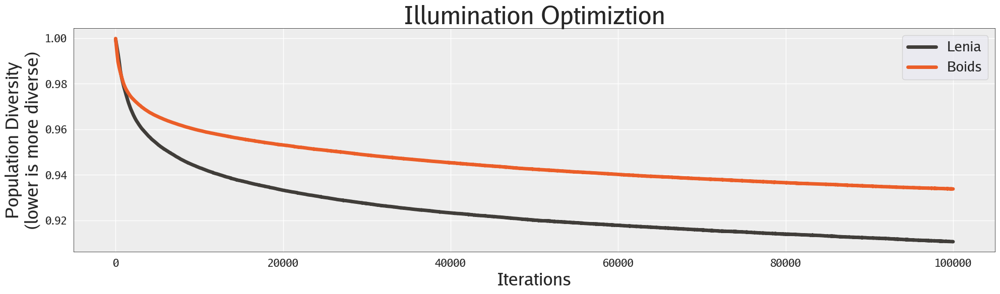

In [22]:
plt.figure(figsize=(20, 6))

for i, cfg in enumerate(tqdm(cfgs)):
    data = util.load_pkl(cfg['save_dir'], 'data')
    c = '#403d39' if i==0 else '#eb5e28'
    print(cfg['sim'])
    label = "Lenia" if i==0 else "Boids"
    plt.plot(data['loss'], label=label, c=c, linewidth=5)
plt.legend(fontsize=20)
plt.title('Illumination Optimiztion', fontsize=35)
plt.ylabel('Population Diversity\n(lower is more diverse)', fontsize=25)
plt.xlabel('Iterations', fontsize=25)
plt.xticks(fontsize=16); plt.yticks(fontsize=16)

plt.gca().set_facecolor("#ededed")
plt.grid(color='white')
[plt.gca().spines[i].set_color('black') for i in ['top', 'bottom', 'left', 'right']]
[plt.gca().spines[i].set_linewidth(0.5) for i in ['top', 'bottom', 'left', 'right']]

plt.tight_layout()
# plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs_final/illumination_learning_curve.pdf", format='pdf', dpi=300, bbox_inches='tight')
# plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs_final/illumination_learning_curve.png", format='png', dpi=300, bbox_inches='tight')

plt.show()


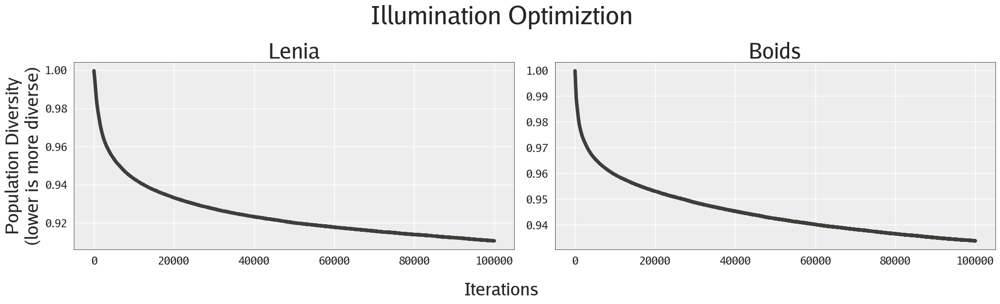

In [31]:
plt.figure(figsize=(20, 6))

plt.subplot(121)
cfg = cfgs[0]
data = util.load_pkl(cfg['save_dir'], 'data')
plt.plot(data['loss'], label="Lenia", c='#403d39', linewidth=5)
plt.xticks(fontsize=16); plt.yticks(fontsize=16)
plt.title("Lenia", fontsize=30)

plt.gca().set_facecolor("#ededed")
plt.grid(color='white')
[plt.gca().spines[i].set_color('black') for i in ['top', 'bottom', 'left', 'right']]
[plt.gca().spines[i].set_linewidth(0.5) for i in ['top', 'bottom', 'left', 'right']]

plt.ylabel('Population Diversity\n(lower is more diverse)', fontsize=25)

plt.subplot(122)
cfg = cfgs[1]
data = util.load_pkl(cfg['save_dir'], 'data')
plt.plot(data['loss'], label="Boids", c='#403d39', linewidth=5)
plt.xticks(fontsize=16); plt.yticks(fontsize=16)
plt.title("Boids", fontsize=30)

plt.gca().set_facecolor("#ededed")
plt.grid(color='white')
[plt.gca().spines[i].set_color('black') for i in ['top', 'bottom', 'left', 'right']]
[plt.gca().spines[i].set_linewidth(0.5) for i in ['top', 'bottom', 'left', 'right']]

plt.suptitle('Illumination Optimiztion', fontsize=35)
plt.gcf().supxlabel('Iterations', fontsize=25)

plt.tight_layout()
plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs_final/illumination_learning_curve.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs_final/illumination_learning_curve.png", format='png', dpi=300, bbox_inches='tight')

plt.show()


# STARTING HERE

In [9]:
sim_name = 'lenia_1.0'
save_dir = f"/home/akarsh_sakana_ai/nca-alife-data/illumination/0_{sim_name}_large/"
pop = util.load_pkl(save_dir, 'pop')
sim = FlattenSimulationParameters(create_sim(sim_name))
rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=clip_model, rollout_steps=sim.sim.rollout_steps, n_rollout_imgs='final')
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
params = pop['params'][:]

data = [jax.vmap(rollout_fn, in_axes=(None, 0))(rng, p) for p in tqdm(params.reshape(-1, 32, params.shape[-1]))] # batched with 32
data = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *data)
data = jax.tree.map(lambda x: rearrange(x, "A B ... -> (A B) ..."), data)
data['params'] = params

data['z_1d'] = UMAP(n_components=1, metric='cosine', random_state=0).fit_transform(data['z'])
data['z_2d'] = UMAP(n_components=2, metric='cosine', random_state=0).fit_transform(data['z'])

from sklearn.decomposition import PCA
data['z_2d_pca'] = PCA(n_components=2).fit_transform(data['z'])

params_random = jax.random.normal(jax.random.PRNGKey(1), (64, params.shape[-1]))*.1
data_random = [rollout_fn(rng, p) for p in tqdm(params_random)]
data_random = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *data_random)
data_random['params'] = params_random

data_lenia = data
data_lenia_random = data_random

sim_name = 'boids'
save_dir = f"/home/akarsh_sakana_ai/nca-alife-data/illumination/0_{sim_name}_large/"
pop = util.load_pkl(save_dir, 'pop')
sim = FlattenSimulationParameters(create_sim(sim_name))
rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=clip_model, rollout_steps=sim.sim.rollout_steps, n_rollout_imgs='final')
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
params = pop['params'][:]

data = [jax.vmap(rollout_fn, in_axes=(None, 0))(rng, p) for p in tqdm(params.reshape(-1, 32, params.shape[-1]))] # batched with 32
data = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *data)
data = jax.tree.map(lambda x: rearrange(x, "A B ... -> (A B) ..."), data)
data['params'] = params
data['z_1d'] = UMAP(n_components=1, metric='cosine', random_state=0).fit_transform(data['z'])
data['z_2d'] = UMAP(n_components=2, metric='cosine', random_state=0).fit_transform(data['z'])

from sklearn.decomposition import PCA
data['z_2d_pca'] = PCA(n_components=2).fit_transform(data['z'])

params_random = jax.random.normal(jax.random.PRNGKey(1), (64, params.shape[-1]))*.1
data_random = [rollout_fn(rng, p) for p in tqdm(params_random)]
data_random = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *data_random)
data_random['params'] = params_random

data_boids = data
data_boids_random = data_random

ParameterReshaper: 3117 parameters detected for optimization.


  0%|          | 0/256 [00:00<?, ?it/s]

Could not load symbol cuFuncGetName. Error: /lib/x86_64-linux-gnu/libcuda.so.1: undefined symbol: cuFuncGetName
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


  0%|          | 0/64 [00:00<?, ?it/s]

ParameterReshaper: 193 parameters detected for optimization.


  0%|          | 0/256 [00:00<?, ?it/s]

/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


  0%|          | 0/64 [00:00<?, ?it/s]

ParameterReshaper: 3117 parameters detected for optimization.


  0%|          | 0/40 [00:00<?, ?it/s]

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1846, 1156) to (1856, 1168) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(
[swscaler @ 0x6057e80] Warning: data is not aligned! This can lead to a speed loss


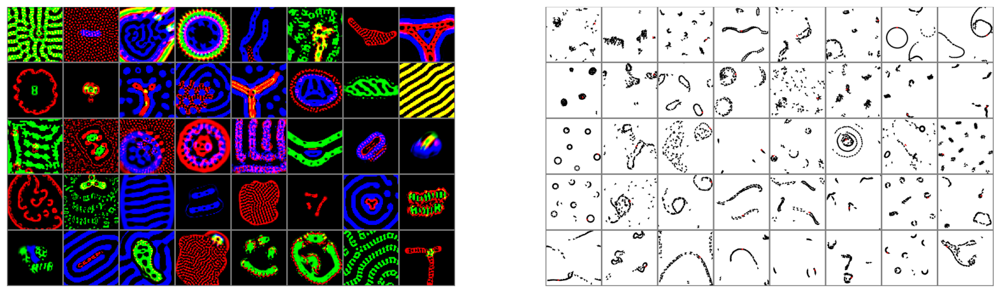

ParameterReshaper: 193 parameters detected for optimization.


  0%|          | 0/40 [00:00<?, ?it/s]

(40, 252, 224, 224, 3)


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1846, 1156) to (1856, 1168) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(
[swscaler @ 0x57d0e80] Warning: data is not aligned! This can lead to a speed loss


In [70]:
pad = 3

rng = jax.random.PRNGKey(4) # 0 3 or 4
idx = jax.random.permutation(rng, len(data_boids['rgb']))[:5*8]

img = data_lenia['rgb'][idx]
img = jnp.pad(img, ((0, 0), (pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0.5)
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", R=5)
img = jnp.pad(img, ((pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0.5)

plt.figure(figsize=(20, 12.5))
plt.subplot(121)
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])

# for i in range(6*9):
    # plt.text((i%9)*224+100, (i//9)*226+100, f"{i}", ha='center', va='center', fontsize=24, color='white', fontweight='bold')
plt.imsave("/home/akarsh_sakana_ai/nca-alife-data/figs_final/teaser_illumination_lenia.png", img)

rng = jax.random.PRNGKey(4)
idx = jax.random.permutation(rng, len(data_boids['rgb']))[:5*8]
sim = FlattenSimulationParameters(create_sim('lenia_1.0'))
rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=None, rollout_steps=252, n_rollout_imgs='video')
rollout_fn = jax.jit(rollout_fn)
params = data_lenia['params'][idx]
vid = np.stack([rollout_fn(jax.random.PRNGKey(0), p)['rgb'] for p in tqdm(params)])
vid = np.pad(vid, ((0, 0), (0, 0), (pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0.5)
vid = rearrange(vid, "(R C) T H W D -> T (R H) (C W) D", R=5)
vid = np.pad(vid, ((0, 0), (pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0.5)
import imageio
vid = np.array(vid*255, dtype=np.uint8)
imageio.mimwrite(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/teaser_illumination_lenia.mp4", vid, fps=42, codec='libx264')


rng = jax.random.PRNGKey(0) # 11 0 or 1
idx = jax.random.permutation(rng, len(data_boids['rgb']))[:5*8]
img = data_boids['rgb'][idx]
img = jnp.pad(img, ((0, 0), (pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0.5)
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", R=5)
img = jnp.pad(img, ((pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0.5)

plt.subplot(122)
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])
plt.show()
plt.imsave("/home/akarsh_sakana_ai/nca-alife-data/figs_final/teaser_illumination_boids.png", img)

rng = jax.random.PRNGKey(0)
idx = jax.random.permutation(rng, len(data_boids['rgb']))[:5*8]
sim = FlattenSimulationParameters(create_sim('boids'))
rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=None, rollout_steps=252*3, n_rollout_imgs=252)
rollout_fn = jax.jit(rollout_fn)
params = data_boids['params'][idx]
vid = np.stack([rollout_fn(jax.random.PRNGKey(0), p)['rgb'] for p in tqdm(params)])
print(vid.shape)
vid = np.pad(vid, ((0, 0), (0, 0), (pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0.5)
vid = rearrange(vid, "(R C) T H W D -> T (R H) (C W) D", R=5)
vid = np.pad(vid, ((0, 0), (pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0.5)
import imageio
vid = np.array(vid*255, dtype=np.uint8)
imageio.mimwrite(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/teaser_illumination_boids.mp4", vid, fps=42, codec='libx264')


In [10]:
def get_simulation_atlas(data, xnum=64, ynum=32, background=0.5):
    z_2d = data['z_2d']
    z_2d = (z_2d-z_2d.min(axis=0))/(z_2d.max(axis=0)-z_2d.min(axis=0))
    x, y = z_2d.T
    # xmin, xmax, ymin, ymax = 0, 1, 0, 1

    xres, yres = 1./xnum, 1./ynum
    x_sample = np.linspace(xres/2, 1.-xres/2, xnum)
    y_sample = np.linspace(yres/2, 1.-yres/2, ynum)
    x_sample, y_sample = np.meshgrid(x_sample, y_sample, indexing='xy')
    xy_sample = np.stack([x_sample, y_sample], axis=-1).reshape(-1, 2)
    x_sample, y_sample = xy_sample.T
    plt.figure(figsize=(20, 12.5))
    imgs, idxs = [], []
    for xi, yi in tqdm(xy_sample):
        dx, dy = jnp.abs(xi-x), jnp.abs(yi-y)
        d = (dx**2 + dy**2)**.5
        mask = (dx<=xres/2) & (dy<=yres/2)
        idx = np.arange(len(d))
        if mask.any():
            idx, d = idx[mask], d[mask]
            idx = idx[d.argmin()]
            img = data['rgb'][idx]
            img = jnp.pad(img, ((2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.5)
            imgs.append(img)
            idxs.append(idx)
        else:
            img = jnp.zeros((224, 224, 3)) + background
            img = jnp.pad(img, ((2, 2), (2, 2), (0, 0)), mode='constant', constant_values=background)
            imgs.append(img)
            idxs.append(None)
    imgs = rearrange(np.stack(imgs), "(R C) H W D -> R C H W D", R=ynum, C=xnum)
    return np.array(imgs), idxs

## Giant Posters of all simulations

In [18]:
img = data_lenia['rgb']
img = img[:]

img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", C=128)
plt.figure(figsize=(80, 80))
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])

for i in tqdm(range(8192)):
    x, y = i%128, i//128
    plt.text(x*226, y*226, str(i), fontsize=8, fontname="Go", color='white', ha='left', va='top')
plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs_final/illumination_poster_lenia.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.close()

  0%|          | 0/8192 [00:00<?, ?it/s]

In [19]:
img = data_boids['rgb']
img = img[:]

img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", C=128)
plt.figure(figsize=(80, 80))
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])

for i in tqdm(range(8192)):
    x, y = i%128, i//128
    plt.text(x*226, y*226, str(i), fontsize=8, fontname="Go", color='black', ha='left', va='top')
plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs_final/illumination_poster_boids.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.close()

  0%|          | 0/8192 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

<Figure size 2000x1250 with 0 Axes>

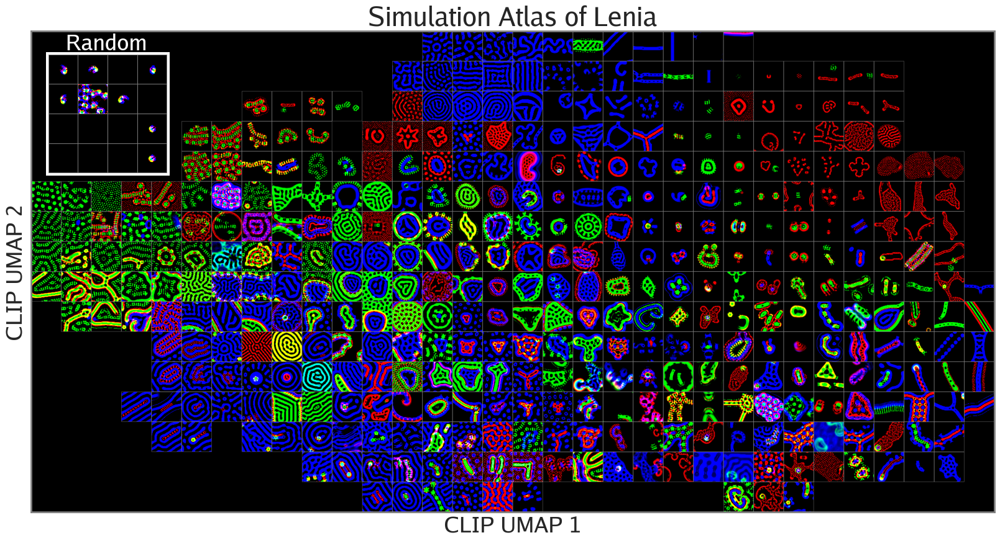

In [20]:
data_lenia_1 = jax.tree.map(lambda x: x, data_lenia)
data_lenia_1['z_2d'] = data_lenia_1['z_2d']*np.array([-1., 1.])
imgs, idxs_lenia = get_simulation_atlas(data_lenia_1, xnum=32, ynum=16, background=0.)
# imgs, idxs_lenia = get_simulation_atlas(data_lenia_1, xnum=24, ynum=12, background=0.)
img = rearrange(imgs, "R C H W D -> (R H) (C W) D")

patch = data_lenia_random['rgb'][:16]
patch = jnp.pad(patch, ((0, 0), (2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.5)
patch = rearrange(patch, "(R C) H W D -> (R H) (C W) D", C=4)
patch = jnp.pad(patch, ((20, 20), (20, 20), (0, 0)), mode='constant', constant_values=1.0)

plt.figure(figsize=(20, 12.5))
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])

for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)

plt.title(f"Simulation Atlas of Lenia", fontsize=30, fontname="Go") # title should be fontsize 35 but for some reason its bigger than the other ones, so we'll just leave it at 30
plt.xlabel("CLIP UMAP 1", fontsize=25, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=25, fontname="Go")

from matplotlib.offsetbox import OffsetImage, AnnotationBbox
imagebox = OffsetImage(patch, zoom=0.15)  # Adjust zoom to control image size
# ab = AnnotationBbox(imagebox, (7296-228*.5, 3648-228*.5), frameon=False, box_alignment=(1., 0.))
ab = AnnotationBbox(imagebox, (228*.5, 228*.7), frameon=False, box_alignment=(0., 1.))
plt.gca().add_artist(ab)
plt.text(228*2.5, 228*.75, "Random", fontsize=25, fontname="Go", color='white', ha='center', va='bottom')

plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_lenia.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_lenia.png", format='png', dpi=300, bbox_inches='tight')
plt.show()

  0%|          | 0/512 [00:00<?, ?it/s]

<Figure size 2000x1250 with 0 Axes>

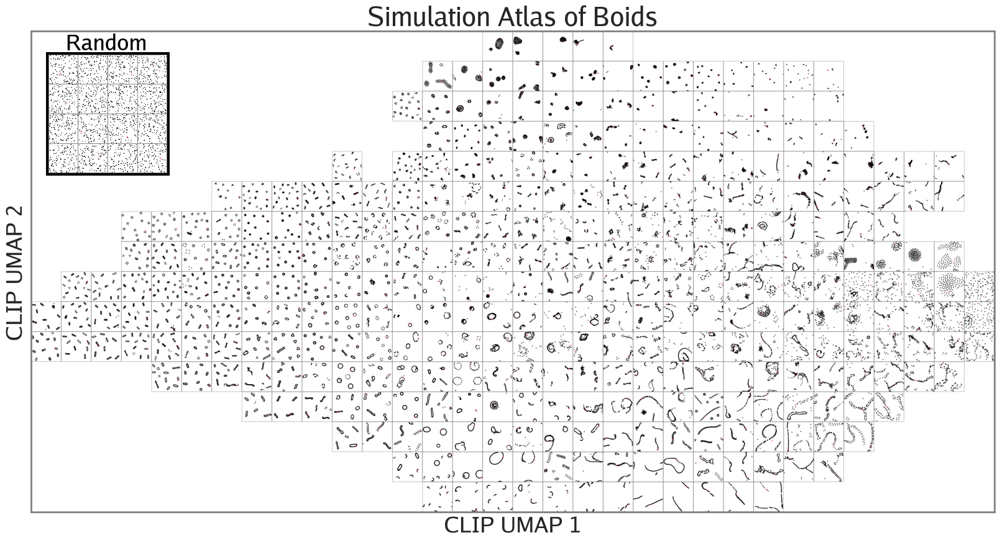

In [21]:
data_boids_1 = jax.tree.map(lambda x: x, data_boids)
data_boids_1['z_2d'] = data_boids_1['z_2d']*np.array([1., 1.])
imgs, idxs_boids = get_simulation_atlas(data_boids_1, xnum=32, ynum=16, background=1.)
# imgs, idxs_boids = get_simulation_atlas(data_boids_1, xnum=20, ynum=10, background=1.)
img = rearrange(imgs, "R C H W D -> (R H) (C W) D")

patch = data_boids_random['rgb'][:16]
patch = jnp.pad(patch, ((0, 0), (2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.5)
patch = rearrange(patch, "(R C) H W D -> (R H) (C W) D", C=4)
patch = jnp.pad(patch, ((20, 20), (20, 20), (0, 0)), mode='constant', constant_values=0.0)

plt.figure(figsize=(20, 12.5))
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])

for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)

plt.title(f"Simulation Atlas of Boids", fontsize=30, fontname="Go") # title should be fontsize 35 but for some reason its bigger than the other ones, so we'll just leave it at 30
plt.xlabel("CLIP UMAP 1", fontsize=25, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=25, fontname="Go")

from matplotlib.offsetbox import OffsetImage, AnnotationBbox
imagebox = OffsetImage(patch, zoom=0.15)  # Adjust zoom to control image size
# ab = AnnotationBbox(imagebox, (7296-228*.5, 3648-228*.5), frameon=False, box_alignment=(1., 0.))
ab = AnnotationBbox(imagebox, (228*.5, 228*.7), frameon=False, box_alignment=(0., 1.))
plt.gca().add_artist(ab)
plt.text(228*2.5, 228*.75, "Random", fontsize=25, fontname="Go", color='black', ha='center', va='bottom')

plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_boids.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_boids.png", format='png', dpi=300, bbox_inches='tight')
plt.show()

In [26]:
sim = FlattenSimulationParameters(create_sim('lenia_1.0'))
# sim.sim.center_phenotype = False
rollout_fn = partial(rollout_simulation, sim=sim, rollout_steps=sim.sim.rollout_steps, img_size=64, n_rollout_imgs='video')
rollout_fn = jax.jit(rollout_fn)
vids = []
for idx in tqdm(idxs_lenia):
    if idx is None:
        vids.append(np.zeros((sim.sim.rollout_steps, 64+2, 64+2, 3)))
    else:
        params = data_lenia_1['params'][idx]
        rng = jax.random.PRNGKey(0)
        vid = rollout_fn(rng, params)['rgb']
        vid = np.pad(vid, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
        vids.append(vid)
vids = np.stack(vids)
vids_random = []
for params in data_lenia_random['params'][:16]:
    rng = jax.random.PRNGKey(0)
    vid = rollout_fn(rng, params)['rgb']
    vid = np.pad(vid, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
    vids_random.append(vid)
vids_random = np.stack(vids_random)

vids_new = []
for vid in vids:
    # print(vid.shape)
    # vid = jax.image.resize(vid, (1000, 66, 66, 3), method='bilinear')
    vids_new.append(vid)
vids = np.stack(vids_new)
# vids = jax.image.resize(vids, (512, 1000, 68, 68, 3), method='bilinear')
# vids_random = jax.image.resize(vids_random, (16, 1000, 66, 66, 3), method='bilinear')
vids = rearrange(vids, "(R C) T H W D -> T (R H) (C W) D", R=16, C=32)
vids_random = rearrange(vids_random, "(R C) T H W D -> T (R H) (C W) D", R=4, C=4)


ParameterReshaper: 3117 parameters detected for optimization.


  0%|          | 0/512 [00:00<?, ?it/s]

In [27]:
# data_lenia_1 = jax.tree.map(lambda x: x, data_lenia)
# data_lenia_1['z_2d'] = data_lenia_1['z_2d']*np.array([-1., 1.])
# imgs, idxs_lenia = get_simulation_atlas(data_lenia_1, xnum=32, ynum=16, background=0.)
img = vids[-1]

patch = vids_random[-1]
# patch = data_lenia_random['rgb'][:16]
# patch = jnp.pad(patch, ((0, 0), (2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.5)
# patch = rearrange(patch, "(R C) H W D -> (R H) (C W) D", C=4)
patch = np.pad(patch, ((5, 5), (5, 5), (0, 0)), mode='constant', constant_values=1.0)

fig = plt.figure(figsize=(20, 12.5))
# fig.subplots_adjust(left=.03, right=.97, top=.97, bottom=.03)  # Remove padding
aximg1 = plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])

for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)

plt.title(f"Simulation Atlas of Lenia", fontsize=30, fontname="Go") # title should be fontsize 35 but for some reason its bigger than the other ones, so we'll just leave it at 30
plt.xlabel("CLIP UMAP 1", fontsize=25, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=25, fontname="Go")

from matplotlib.offsetbox import OffsetImage, AnnotationBbox
imagebox = OffsetImage(patch, zoom=0.15*224/64)  # Adjust zoom to control image size
# ab = AnnotationBbox(imagebox, (7296-228*.5, 3648-228*.5), frameon=False, box_alignment=(1., 0.))
ab = AnnotationBbox(imagebox, (66*.5, 66*.7), frameon=False, box_alignment=(0., 1.))
plt.gca().add_artist(ab)
plt.text(66*2.5, 66*.75, "Random", fontsize=25, fontname="Go", color='white', ha='center', va='bottom')


from matplotlib.animation import FuncAnimation, FFMpegWriter
def update(timestep):
    if timestep%50==0:
        print(timestep)
    img = vids[timestep]
    patch = vids_random[timestep]
    patch = np.pad(patch, ((5, 5), (5, 5), (0, 0)), mode='constant', constant_values=1.0)

    aximg1.set_data(img)
    imagebox.set_data(patch)
    return [aximg1, ab]

ani = FuncAnimation(fig, update, frames=256, interval=20.)
writervideo = FFMpegWriter(fps=1000/20)
ani.save("/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_lenia.mp4", writer=writervideo)
plt.close()

0
0
50
100
150
200
250


In [24]:
sim = FlattenSimulationParameters(create_sim('boids'))
rollout_fn = partial(rollout_simulation, sim=sim, rollout_steps=sim.sim.rollout_steps, img_size=64, n_rollout_imgs='video')
rollout_fn = jax.jit(rollout_fn)
vids = []
for idx in tqdm(idxs_boids):
    if idx is None:
        vids.append(np.ones((sim.sim.rollout_steps, 64+2, 64+2, 3)))
    else:
        params = data_boids['params'][idx]
        rng = jax.random.PRNGKey(0)
        vid = rollout_fn(rng, params)['rgb']
        vid = np.pad(vid, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
        vids.append(vid)
vids = np.stack(vids)
vids_random = []
for params in data_boids_random['params'][:16]:
    rng = jax.random.PRNGKey(0)
    vid = rollout_fn(rng, params)['rgb']
    vid = np.pad(vid, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
    vids_random.append(vid)
vids_random = np.stack(vids_random)

vids_new = []
for vid in vids:
    # vid = jax.image.resize(vid, (1000, 66, 66, 3), method='bilinear')
    vids_new.append(vid)
vids = np.stack(vids_new)
# vids = jax.image.resize(vids, (512, 1000, 68, 68, 3), method='bilinear')
# vids_random = jax.image.resize(vids_random, (16, 1000, 66, 66, 3), method='bilinear')
vids = rearrange(vids, "(R C) T H W D -> T (R H) (C W) D", R=16, C=32)
vids_random = rearrange(vids_random, "(R C) T H W D -> T (R H) (C W) D", R=4, C=4)


ParameterReshaper: 193 parameters detected for optimization.


  0%|          | 0/512 [00:00<?, ?it/s]

In [25]:
# data_lenia_1 = jax.tree.map(lambda x: x, data_lenia)
# data_lenia_1['z_2d'] = data_lenia_1['z_2d']*np.array([-1., 1.])
# imgs, idxs_lenia = get_simulation_atlas(data_lenia_1, xnum=32, ynum=16, background=0.)
img = vids[-1]

patch = vids_random[-1]
# patch = data_lenia_random['rgb'][:16]
# patch = jnp.pad(patch, ((0, 0), (2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.5)
# patch = rearrange(patch, "(R C) H W D -> (R H) (C W) D", C=4)
patch = np.pad(patch, ((5, 5), (5, 5), (0, 0)), mode='constant', constant_values=0.0)

fig = plt.figure(figsize=(20, 12.5))
aximg1 = plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])

for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)

plt.title(f"Simulation Atlas of Boids", fontsize=30, fontname="Go") # title should be fontsize 35 but for some reason its bigger than the other ones, so we'll just leave it at 30
plt.xlabel("CLIP UMAP 1", fontsize=25, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=25, fontname="Go")

from matplotlib.offsetbox import OffsetImage, AnnotationBbox
imagebox = OffsetImage(patch, zoom=0.15*224/64)  # Adjust zoom to control image size
# ab = AnnotationBbox(imagebox, (7296-228*.5, 3648-228*.5), frameon=False, box_alignment=(1., 0.))
ab = AnnotationBbox(imagebox, (66*.5, 66*.7), frameon=False, box_alignment=(0., 1.))
plt.gca().add_artist(ab)
plt.text(66*2.5, 66*.75, "Random", fontsize=25, fontname="Go", color='black', ha='center', va='bottom')

from matplotlib.animation import FuncAnimation, FFMpegWriter
def update(timestep):
    if timestep%100==0:
        print(timestep)
    timestep = timestep*4
    img = vids[timestep]
    patch = vids_random[timestep]
    patch = np.pad(patch, ((5, 5), (5, 5), (0, 0)), mode='constant', constant_values=0.0)

    aximg1.set_data(img)
    imagebox.set_data(patch)
    return [aximg1, ab]

ani = FuncAnimation(fig, update, frames=250, interval=50.)
writervideo = FFMpegWriter(fps=1000/50)
ani.save("/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_boids.mp4", writer=writervideo)
plt.close()

0
0
100
200


In [16]:
data_lenia_1 = jax.tree.map(lambda x: x, data_lenia)
data_lenia_1['z_2d'] = data_lenia_1['z_2d']*np.array([-1., 1.])
imgs, idxs = get_simulation_atlas(data_lenia_1, xnum=32, ynum=16, background=0.)

  0%|          | 0/512 [00:00<?, ?it/s]

<Figure size 2000x1250 with 0 Axes>

In [17]:
len([i for i in idxs if i is not None])

396

In [14]:
# sim = FlattenSimulationParameters(create_sim('lenia_1.0'))
sim = Lenia(grid_size=128, center_phenotype=False, phenotype_size=64, start_pattern="5N7KKM", clip1=1.)
sim = FlattenSimulationParameters(sim)

rollout_fn = partial(rollout_simulation, sim=sim, rollout_steps=256, img_size=32, n_rollout_imgs='video')
rollout_fn = jax.jit(rollout_fn)

vids = []
for idx in tqdm(idxs):
    if idx is None:
        vid = np.zeros((256, 32+2, 32+2, 3))
        vids.append(vid)
        continue
    params = data_lenia_1['params'][idx]
    rng = jax.random.PRNGKey(0)
    vid = rollout_fn(rng, params)['rgb']
    vid = jnp.pad(vid, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
    vids.append(vid)

ParameterReshaper: 3117 parameters detected for optimization.


  0%|          | 0/512 [00:00<?, ?it/s]

In [15]:
vids = np.stack(vids)

In [16]:
vids = rearrange(vids, "(R C) T H W D -> T (R H) (C W) D", R=16, C=32)
vids.shape

(256, 544, 1088, 3)

In [17]:
vids = np.pad(vids, ((0, 0), (4, 4), (4, 4), (0, 0)), mode='constant', constant_values=0.5)

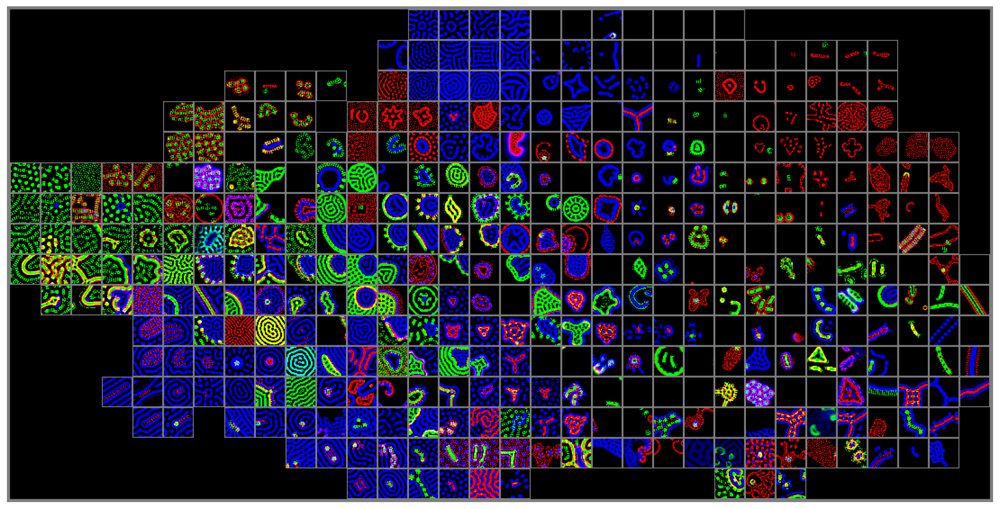

In [18]:
plt.figure(figsize=(20, 12.5))
plt.imshow(vids[-1])
plt.grid(False)
plt.xticks([]); plt.yticks([])
plt.show()

In [91]:
vid_zoom = []
for img, scale in zip(vids, np.linspace(8., 1., len(vids))):
    h, w, d = a.shape
    mh, mw = h//2, w//2
    translation = np.array([mh-scale*h/2., mw-scale*w/2.])
    a = jax.image.scale_and_translate(img, shape=(552, 1096, 3), spatial_dims=(0, 1), scale=np.array([scale, scale]), translation=translation, method='bilinear')
    vid_zoom.append(a)
vid_zoom = np.stack(vid_zoom)

In [94]:
a = np.array(vid_zoom*255, dtype=np.uint8)
imageio.mimwrite(f"/home/akarsh_sakana_ai/nca-alife-data/figs_vids/illumination_lenia_zoom.mp4", a, fps=30, codec='libx264')

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1096, 552) to (1104, 560) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(
[swscaler @ 0x629ce80] Warning: data is not aligned! This can lead to a speed loss


In [19]:
# a = np.array(vids*255, dtype=np.uint8)
# imageio.mimwrite(f"/home/akarsh_sakana_ai/nca-alife-data/figs_vids/illumination_lenia.mp4", a, fps=30, codec='libx264')

## Static Atlas Large

In [15]:
# imgs, _ = get_simulation_atlas(data_lenia, xnum=128, ynum=64, background=0.)
imgs, _ = get_simulation_atlas(data_lenia, xnum=128, ynum=84, background=0.)
img = rearrange(imgs, "R C H W D -> (R H) (C W) D")
plt.figure(figsize=(20, 12.5))
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])
for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)
plt.title(f"Large Simulation Atlas of Lenia", fontsize=20, fontname="Go")
plt.xlabel("CLIP UMAP 1", fontsize=15, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=15, fontname="Go")
plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_lenia_large.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_lenia_large.png", format='png', dpi=300, bbox_inches='tight')
plt.close()

  0%|          | 0/10752 [00:00<?, ?it/s]

<Figure size 2000x1250 with 0 Axes>

In [18]:
# imgs, _ = get_simulation_atlas(data_boids, xnum=128, ynum=64, background=1.)
imgs, _ = get_simulation_atlas(data_boids, xnum=128, ynum=84, background=1.)
img = rearrange(imgs, "R C H W D -> (R H) (C W) D")
plt.figure(figsize=(20, 12.5))
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])
for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)
plt.title(f"Large Simulation Atlas of Boids", fontsize=20, fontname="Go")
plt.xlabel("CLIP UMAP 1", fontsize=15, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=15, fontname="Go")
plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_boids_large.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs_final/atlas_boids_large.png", format='png', dpi=300, bbox_inches='tight')
plt.close()

  0%|          | 0/10752 [00:00<?, ?it/s]

<Figure size 2000x1250 with 0 Axes>

## Video Atlas Large

In [135]:
def construct_atlas_img(idxs, imgs, background=0.):
    imgs = np.pad(imgs, ((0, 0), (2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.5)
    background_img = np.ones_like(imgs[0])*background
    atlas_img = []
    i = 0
    for idx in idxs:
        if idx is None:
            atlas_img.append(background_img)
        else:
            atlas_img.append(imgs[i])
            i+=1
    atlas_img = np.stack(atlas_img)
    return atlas_img

In [ ]:
imgs, idxs_lenia = get_simulation_atlas(data_lenia, xnum=128, ynum=64, background=0.)
params = [data_lenia['params'][i] for i in idxs_lenia if i is not None]

sim = FlattenSimulationParameters(create_sim('lenia_1.0'))
step_state = jax.jit(sim.step_state)
rng = jax.random.PRNGKey(0)

state = [sim.init_state(rng, p) for p in tqdm(params)]

ParameterReshaper: 3117 parameters detected for optimization.


  0%|          | 0/4015 [00:00<?, ?it/s]

In [132]:
t = np.linspace(0, 1, 256)
# start_percent = 0.02
# y = np.sqrt((1-start_percent**2)*t+start_percent**2)
y = np.linspace(0.03, 1.1, 256).clip(None, 1.)

zoom_video = []
for t in tqdm(range(0, 256, 1)):
    imgs = np.stack([sim.render_state(state[i], p) for i, p in enumerate(params)])
    for i, p in enumerate(params):
        state[i] = step_state(rng, state[i], p)

    atlas_img = construct_atlas_img(idxs_lenia, imgs, background=0.)
    atlas_img = rearrange(atlas_img, "(R C) H W D -> (R H) (C W) D", R=64, C=128)

    h, w, d = atlas_img.shape
    zoom = .1
    zoom = y[t]
    scale = 512/h/zoom
    mh, mw = h//2, w//2
    # translation = np.array([mh-scale*h/2., mw-scale*w/2.])
    # translation = np.array([50, 50])
    translation = np.array([(512-h*scale)/2., (1024-w*scale)/2.])
    # translation = np.zeros_like(translation)
    # atlas_img = jax.image.scale_and_translate(atlas_img, shape=(512, 1024, 3), spatial_dims=(0, 1), scale=np.array([scale, scale]), translation=translation, method='bilinear')
    # atlas_img = jax.image.resize(atlas_img, (512, 1024, 3), method='bilinear')
    zoom_img = jax.image.scale_and_translate(atlas_img, shape=(512, 1024, 3), spatial_dims=(0, 1), scale=np.array([scale, scale]), translation=translation, method='bilinear')

    zoom_video.append(np.array(zoom_img.clip(0., 1.)))

  0%|          | 0/256 [00:00<?, ?it/s]

In [ ]:
# imgs, _ = get_simulation_atlas(data_lenia, xnum=128, ynum=64, background=0.)
# img = rearrange(imgs, "R C H W D -> (R H) (C W) D")
fig = plt.figure(figsize=(20, 12.5))
aximg = plt.imshow(zoom_video[-1])
plt.grid(False)
plt.xticks([]); plt.yticks([])
for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)
plt.title(f"Large Simulation Atlas of Lenia", fontsize=20, fontname="Go")
plt.xlabel("CLIP UMAP 1", fontsize=15, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=15, fontname="Go")
# plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs/atlas_lenia_large.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.close()

def update(timestep):
    img = zoom_video[timestep]
    aximg.set_data(img)
    return [aximg]

from matplotlib.animation import FuncAnimation, FFMpegWriter
ani = FuncAnimation(fig, update, frames=256, interval=40.)
writervideo = FFMpegWriter(fps=1000/(40))
ani.save("/home/akarsh_sakana_ai/nca-alife-data/figs_vids/atlas_lenia_large.mp4", writer=writervideo)
plt.close()

In [191]:
imgs, idxs_boids = get_simulation_atlas(data_boids, xnum=128, ynum=64, background=0.)
params = [data_boids['params'][i] for i in idxs_boids if i is not None]

sim = FlattenSimulationParameters(create_sim('boids'))
step_state = jax.jit(sim.step_state)
render_fn = jax.jit(partial(sim.render_state, img_size=128))
rng = jax.random.PRNGKey(0)

state = [sim.init_state(rng, p) for p in tqdm(params)]
state = jax.tree.map(lambda *x: jnp.stack(x), *state)

  0%|          | 0/8192 [00:00<?, ?it/s]

ParameterReshaper: 193 parameters detected for optimization.


  0%|          | 0/3656 [00:00<?, ?it/s]

<Figure size 2000x1250 with 0 Axes>

In [192]:
t = np.linspace(0, 1, 256)
# start_percent = 0.02
# y = np.sqrt((1-start_percent**2)*t+start_percent**2)
y = np.linspace(0.03, 1.1, 256).clip(None, 1.)

zoom_video = []
for t in tqdm(range(0, 256, 1)):
    imgs = jax.vmap(render_fn)(state, jnp.stack(params))
    # imgs = np.stack([sim.render_state(state[i], p) for i, p in enumerate(params)])
    state = jax.vmap(step_state, in_axes=(None, 0, 0))(rng, state, jnp.stack(params))
    # for i, p in enumerate(params):
        # state[i] = step_state(rng, state[i], p)

    atlas_img = construct_atlas_img(idxs_boids, imgs, background=1.)
    atlas_img = rearrange(atlas_img, "(R C) H W D -> (R H) (C W) D", R=64, C=128)

    h, w, d = atlas_img.shape
    zoom = .1
    zoom = y[t]
    scale = 512/h/zoom
    mh, mw = h//2, w//2
    # translation = np.array([mh-scale*h/2., mw-scale*w/2.])
    # translation = np.array([50, 50])
    translation = np.array([(512-h*scale)/2., (1024-w*scale)/2.])
    # translation = np.zeros_like(translation)
    # atlas_img = jax.image.scale_and_translate(atlas_img, shape=(512, 1024, 3), spatial_dims=(0, 1), scale=np.array([scale, scale]), translation=translation, method='bilinear')
    # atlas_img = jax.image.resize(atlas_img, (512, 1024, 3), method='bilinear')
    zoom_img = jax.image.scale_and_translate(atlas_img, shape=(512, 1024, 3), spatial_dims=(0, 1), scale=np.array([scale, scale]), translation=translation, method='bilinear')

    zoom_video.append(np.array(zoom_img.clip(0., 1.)))

  0%|          | 0/256 [00:00<?, ?it/s]

In [193]:
# imgs, _ = get_simulation_atlas(data_boids, xnum=128, ynum=64, background=0.)
# img = rearrange(imgs, "R C H W D -> (R H) (C W) D")
fig = plt.figure(figsize=(20, 12.5))
aximg = plt.imshow(zoom_video[-1])
plt.grid(False)
plt.xticks([]); plt.yticks([])
for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)
plt.title(f"Large Simulation Atlas of Boids", fontsize=20, fontname="Go")
plt.xlabel("CLIP UMAP 1", fontsize=15, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=15, fontname="Go")
# plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs/atlas_boids_large.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.close()

def update(timestep):
    img = zoom_video[timestep]
    aximg.set_data(img)
    return [aximg]

from matplotlib.animation import FuncAnimation, FFMpegWriter
ani = FuncAnimation(fig, update, frames=256, interval=40.)
writervideo = FFMpegWriter(fps=1000/(40))
ani.save("/home/akarsh_sakana_ai/nca-alife-data/figs_vids/atlas_boids_large.mp4", writer=writervideo)
plt.close()

In [57]:
sim_name = 'lenia_1.0'
save_dir = f"/home/akarsh_sakana_ai/nca-alife-data/illumination/0_{sim_name}_large/"
pop = util.load_pkl(save_dir, 'pop')
sim = FlattenSimulationParameters(create_sim(sim_name))
rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=clip_model, rollout_steps=sim.sim.rollout_steps, n_rollout_imgs='final')
rollout_fn = jax.jit(rollout_fn)

rng = jax.random.PRNGKey(0)
idx = jax.random.permutation(rng, len(pop['params']))[:32]
params = pop['params'][idx]

ParameterReshaper: 3117 parameters detected for optimization.


In [58]:
rng = jax.random.PRNGKey(0)
rollout_data = []
for i in tqdm(range(32)):
    for j in range(32):
        p = params[0]
        p[:45] = params[i][:45]
        p[45:] = params[j][45:]
        rollout_data.append(rollout_fn(rng, p))
rollout_data = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *rollout_data)
rollout_data = jax.tree.map(lambda x: rearrange(x, "(A B) ... -> A B ...", A=32), rollout_data)

  0%|          | 0/32 [00:00<?, ?it/s]

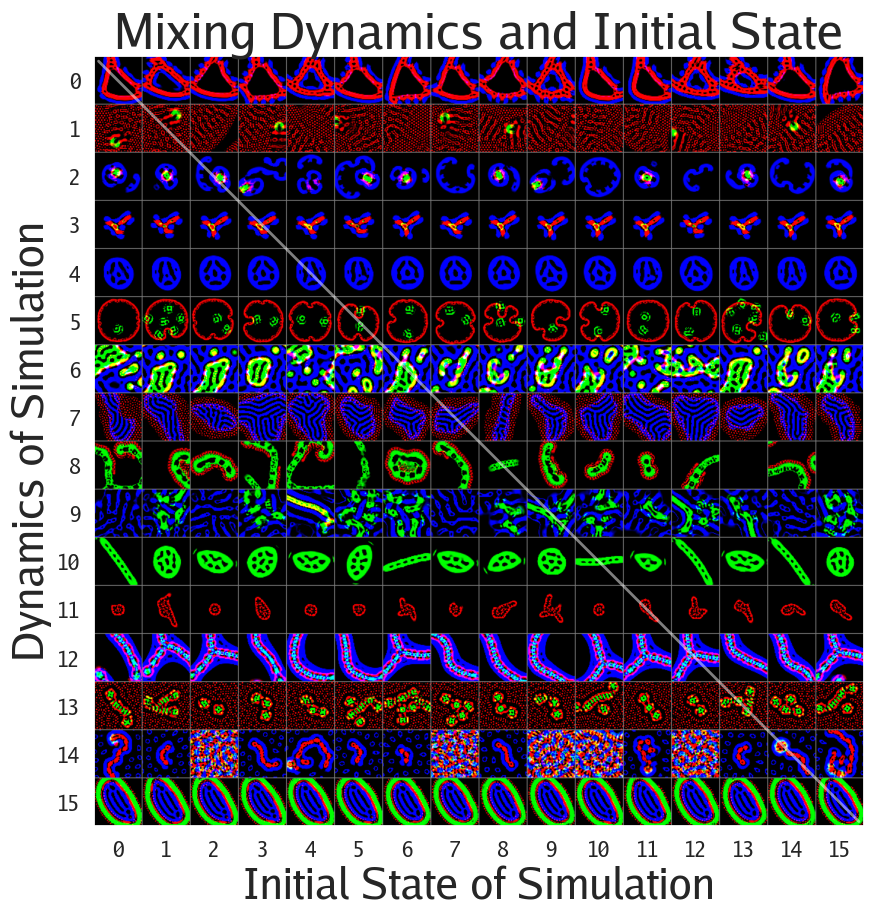

In [73]:
img = rollout_data['rgb'][:16, :16]
img = jnp.pad(img, ((0, 0), (0, 0), (2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.5)
img = rearrange(img, "R C H W D -> (R H) (C W) D")
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])
plt.title("Mixing Dynamics and Initial State", fontsize=35, fontname="Go")
plt.ylabel("Dynamics of Simulation", fontsize=30, fontname="Go")
plt.xlabel("Initial State of Simulation", fontsize=30, fontname="Go")
plt.xticks(np.arange(16)*228+228*.5, np.arange(16), fontsize=15, fontname="Go")
plt.yticks(np.arange(16)*228+228*.5, np.arange(16), fontsize=15, fontname="Go")

plt.plot([.1*228, 15.9*228], [.1*228, 15.9*228], c='white', alpha=0.5, linewidth=2)
# plt.plot([.1*228, 14.9*228], [1.1*228, 15.9*228], c='white', alpha=0.5, linewidth=2)
# plt.savefig(f"/home/akarsh_sakana_ai/nca-alife-data/figs/mixing_dynamics_initial_state.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.show()

In [18]:
patch_data = [
    (.5, .5, 0.9, 0.9)
]

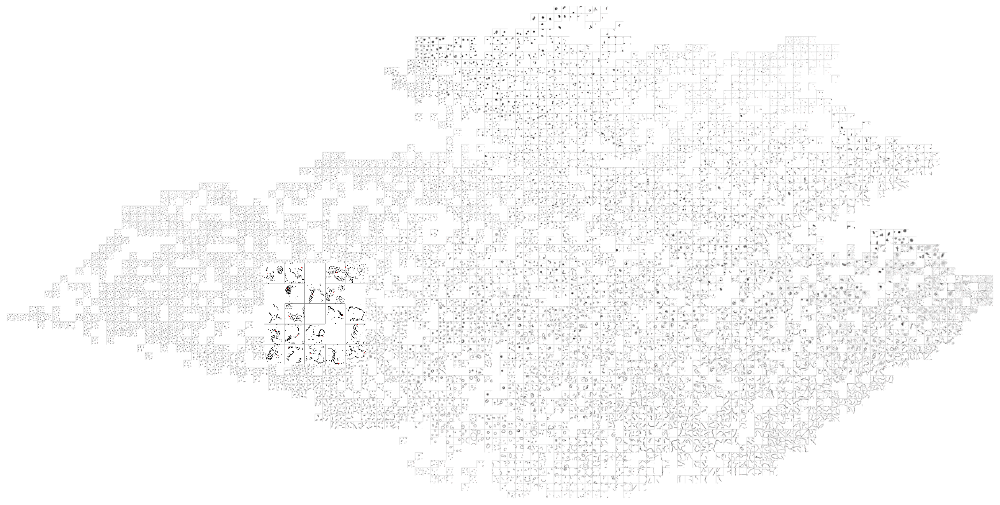

In [33]:

img = rearrange(imgs[:, :, ::4, ::4, :], "R C H W D -> (R H) (C W) D")

plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.grid(False)
plt.xticks([]); plt.yticks([])

# for x, y, xp, yp in patch_data:


    
#     imagebox = OffsetImage(patch, zoom=0.05)  # Adjust zoom to control image size
#     ab = AnnotationBbox(imagebox, (0., 0.), frameon=False)
#     # Add arrow from (xp, yp) to (x, y)
#     # plt.annotate('', xy=(x, y), xytext=(xp, yp),
#                     # arrowprops=dict(arrowstyle='->', color='black', linewidth=2., alpha=1., mutation_scale=30),
#                     # annotation_clip=False)
#     plt.gca().add_artist(ab)

patch = imgs[40:40+5, 115:115+5]
patch = rearrange(patch, "R C H W D -> (R H) (C W) D")
imagebox = OffsetImage(patch, zoom=0.1)  # Adjust zoom to control image size
ab = AnnotationBbox(imagebox, (228.*10, 228.*10), frameon=False)
# Add arrow from (xp, yp) to (x, y)
# plt.annotate('', xy=(x, y), xytext=(xp, yp),
                # arrowprops=dict(arrowstyle='->', color='black', linewidth=2., alpha=1., mutation_scale=30),
                # annotation_clip=False)
plt.gca().add_artist(ab)


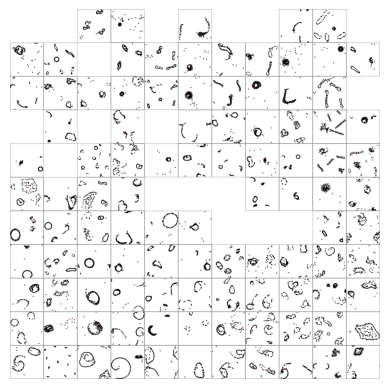

In [ ]:
plt.pcolormesh(patch, )

  0%|          | 0/2048 [00:00<?, ?it/s]

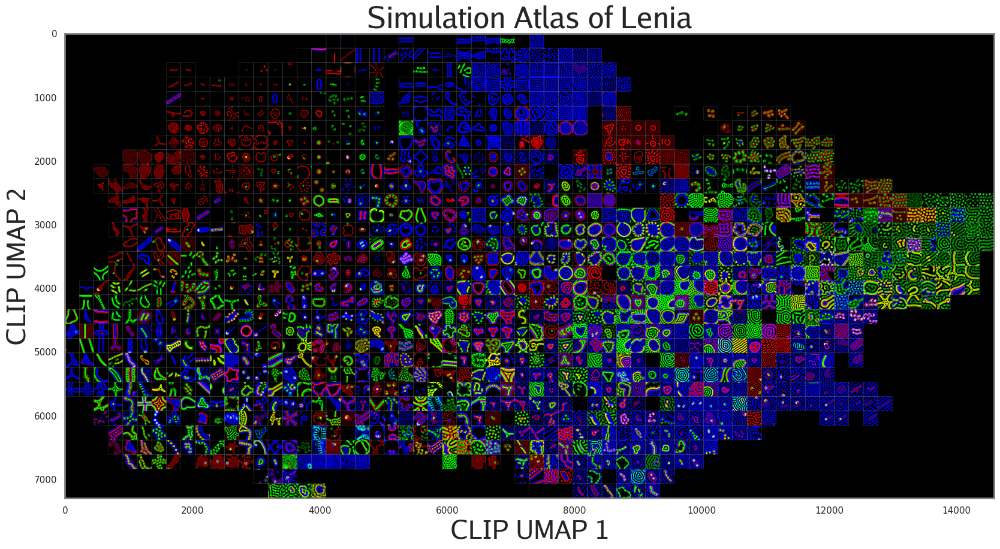

In [13]:
z_2d = data['z_2d']
z_2d = (z_2d-z_2d.min(axis=0))/(z_2d.max(axis=0)-z_2d.min(axis=0))
x, y = z_2d.T
# plt.scatter(x, y, c=data['rgb'].mean(axis=(1, 2)))
# plt.show()

xmin, xmax, ymin, ymax = 0, 1, 0, 1

# xmin, xmax = xmin + (xmax-xmin)*.0, xmax - (xmax-xmin)*.0
# ymin, ymax = ymin + (ymax-ymin)*.0, ymax - (ymax-ymin)*.0

xnum, ynum = 64, 32
xres, yres = 1./xnum, 1./ynum
x_sample = jnp.linspace(xres/2, 1.-xres/2, xnum)
y_sample = jnp.linspace(yres/2, 1.-yres/2, ynum)
x_sample, y_sample = jnp.meshgrid(x_sample, y_sample, indexing='xy')
xy_sample = jnp.stack([x_sample, y_sample], axis=-1).reshape(-1, 2)
x_sample, y_sample = xy_sample.T

plt.figure(figsize=(20, 12.5))

imgs = []
for xi, yi in tqdm(xy_sample):
    dx, dy = jnp.abs(xi-x), jnp.abs(yi-y)
    d = (dx**2 + dy**2)**.5
    mask = (dx<=xres/2) & (dy<=yres/2)
    idx = np.arange(len(d))
    if mask.any():
        idx, d = idx[mask], d[mask]
        idx = idx[d.argmin()]
        img = data['rgb'][idx]
        img = jnp.pad(img, ((2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.5)
        imgs.append(img)
    else:
        img = jnp.zeros((224, 224, 3))
        img = jnp.pad(img, ((2, 2), (2, 2), (0, 0)), mode='constant', constant_values=0.0)
        imgs.append(img)
imgs = rearrange(jnp.stack(imgs), "(R C) H W D -> R C H W D", R=ynum, C=xnum)
img = rearrange(imgs, "R C H W D -> (R H) (C W) D")

plt.imshow(img)
plt.grid(False)
# plt.xticks([]); plt.yticks([])


# for xi, yi in zip(x_sample, y_sample):
#     i = int(xi//xres)
#     j = int(yi//yres)
#     plt.text(xi*xnum*228, yi*ynum*228, f"{j},{i}", fontsize=8, fontname="Go", c='red', ha='center', va='center')


for spine in plt.gca().spines.values():
    spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
    spine.set_linewidth(2)

plt.title("Simulation Atlas of Lenia", fontsize=35, fontname="Go")
plt.xlabel("CLIP UMAP 1", fontsize=30, fontname="Go")
plt.ylabel("CLIP UMAP 2", fontsize=30, fontname="Go")
# plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs/lenia_atlas.pdf", format='pdf', dpi=300, bbox_inches='tight')


plt.show()



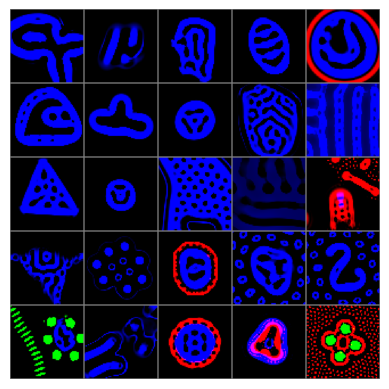

In [14]:
img = imgs[7-2:7+3, 29-2:29+3]
img = rearrange(img, "R C H W D -> (R H) (C W) D")
img.shape
plt.imshow(img)
plt.grid(False)
plt.axis('off')
plt.show()

In [ ]:
a = sorted(a)

In [ ]:
x[18], y[18]

(np.float32(0.2095723), np.float32(0.50366575))

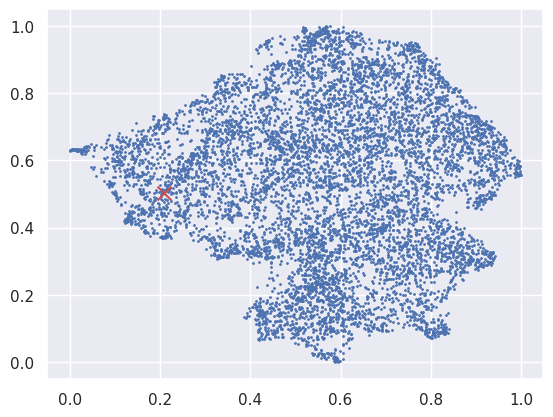

In [ ]:
z_2d = data['z_2d']
z_2d = (z_2d-z_2d.min(axis=0))/(z_2d.max(axis=0)-z_2d.min(axis=0))
x, y = z_2d.T

plt.scatter(x, y, s=1.)
plt.scatter(x[18], y[18], c='r', marker='x', s=100)


xnum, ynum = 32, 16
xres, yres = 1./xnum, 1./ynum
x_sample = jnp.linspace(0., 1., xnum)
y_sample = jnp.linspace(0., 1., ynum)
x_sample, y_sample = jnp.meshgrid(x_sample, y_sample, indexing='xy')
xy_sample = jnp.stack([x_sample, y_sample], axis=-1).reshape(-1, 2)

In [ ]:
x_sample = jnp.linspace(0., 1., xnum)

In [ ]:
x_sample[1]-x_sample[0]

Array(0.03225806, dtype=float32)

In [ ]:
xres

0.03125

In [ ]:
a = []
for i in tqdm(range(len(xy_sample))):
    xyi = xy_sample[i]
    dx, dy = jnp.abs(xyi - z_2d).T
    mask = (dx<xres/2) & (dy<yres/2)


    dx[18],
    # a.append(mask[18])

  0%|          | 0/512 [00:00<?, ?it/s]

In [ ]:
np.stack(a).any()

np.False_

In [ ]:
x[18]/xres, y[18]/yres

(np.float32(6.7063136), np.float32(8.058652))

In [ ]:
6, 8

(6, 8)

In [ ]:
x[18], y[18]

(np.float32(0.2095723), np.float32(0.50366575))

In [ ]:
p = params[0]
params_random = jax.random.normal(jax.random.PRNGKey(0), params.shape)*1.
data_random = [rollout_fn(rng, p) for p in tqdm(params_random[:128])]
data_random = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *data_random)

  0%|          | 0/128 [00:00<?, ?it/s]

In [ ]:
img = data_random['rgb']
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", C=16)
plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.grid(False)
plt.axis('off')
plt.show()

In [ ]:
i = 15
img = data['rgb'][i*512:(i+1)*512, ::4, ::4]
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", C=32)
plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.grid(False)
plt.axis('off')
plt.show()

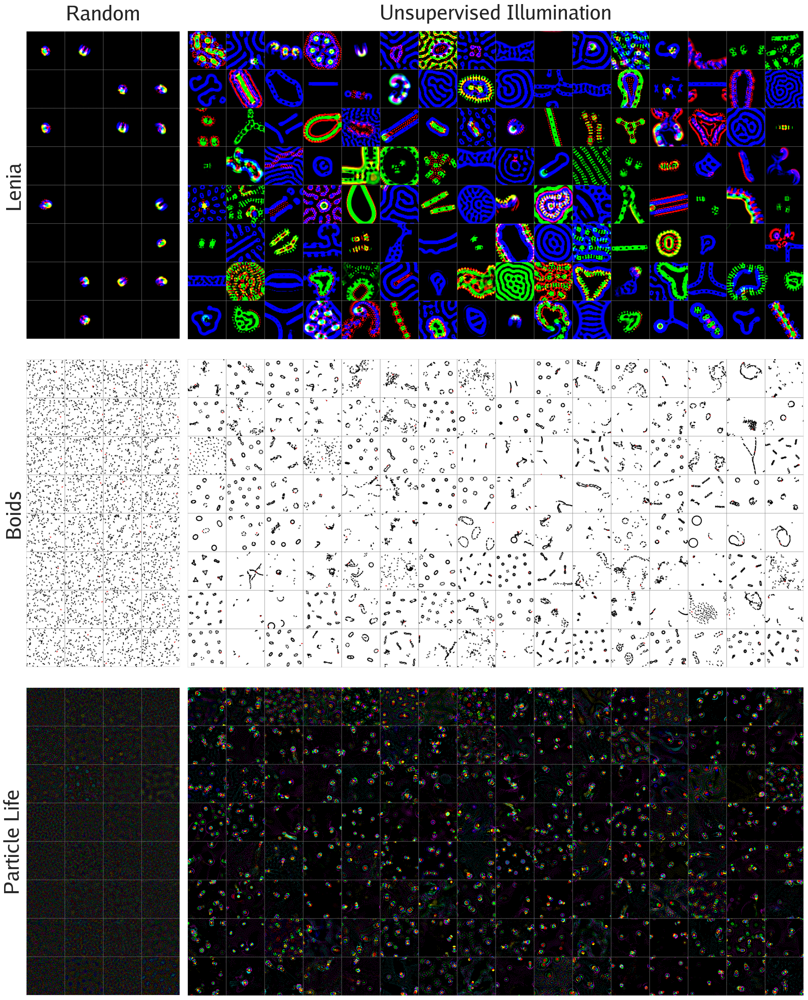

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(20, 25), gridspec_kw={'width_ratios': [1, 4]})

for iplt, substrate in enumerate(substrates):
    img = substrate2data[f'random_{substrate}']['rgb'][:8*4]
    img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
    img = rearrange(img, "(R C) H W D -> (R H) (C W) D", R=8)
    img = jnp.pad(img, ((2, 2), (2, 2), (0, 0)), mode='constant', constant_values=1.0) # needed for bullshit matplotlib subplot title bug reasons

    plt.sca(axs[iplt, 0])
    plt.imshow(img)
    plt.grid(False)
    # plt.axis('off')
    plt.xticks([]); plt.yticks([])

    img = substrate2data[f'{substrate}']['rgb'][:8*16]
    img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
    img = rearrange(img, "(R C) H W D -> (R H) (C W) D", R=8)
    img = jnp.pad(img, ((2, 2), (2, 2), (0, 0)), mode='constant', constant_values=1.0) # needed for bullshit matplotlib subplot title bug reasons
    
    plt.sca(axs[iplt, 1])
    plt.imshow(img)
    plt.grid(False)
    # plt.axis('off')
    plt.xticks([]); plt.yticks([])

axs[0, 0].set_ylabel("Lenia", fontsize=35, fontname="Go")
axs[1, 0].set_ylabel("Boids", fontsize=35, fontname="Go")
axs[2, 0].set_ylabel("Particle Life", fontsize=35, fontname="Go")

axs[0, 0].set_title(f"Random", fontsize=35, fontname="Go", pad=20)
axs[0, 1].set_title(f"Unsupervised Illumination", fontsize=35, fontname="Go", pad=20)

plt.tight_layout()

# plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs/illumination.png", dpi=300)
plt.show()

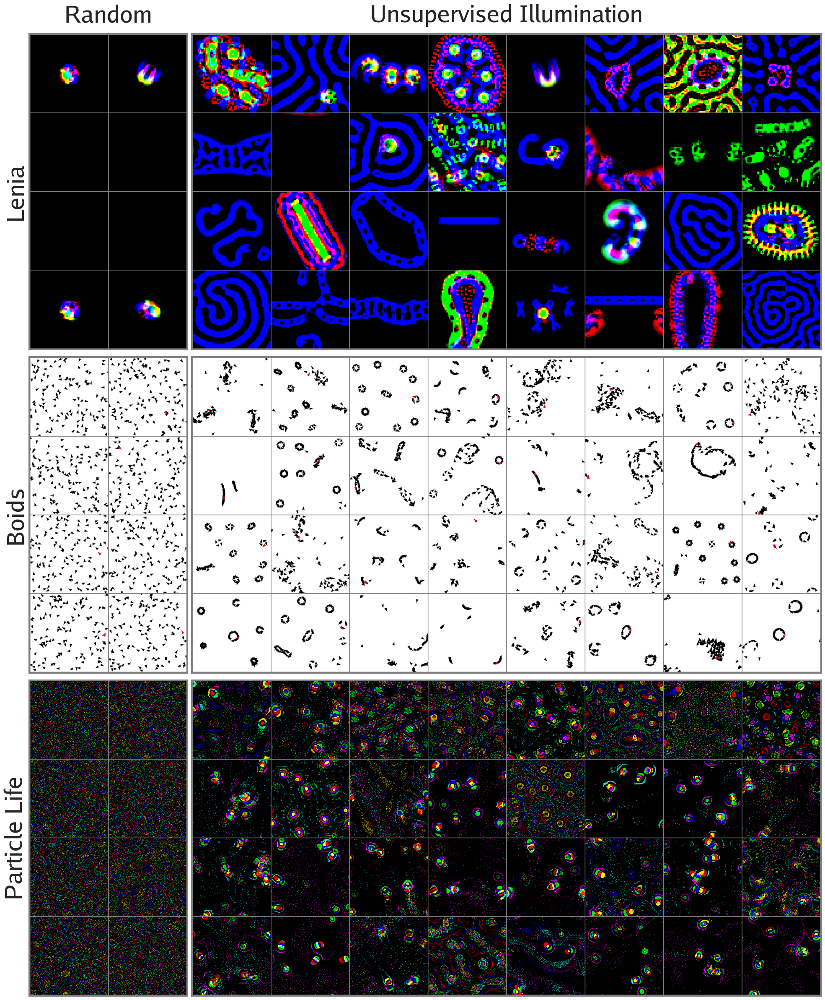

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(20, 24), gridspec_kw={'width_ratios': [1, 4]})

for iplt, substrate in enumerate(substrates):
    img = substrate2data[f'random_{substrate}']['rgb'][:4*2]
    img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
    img = rearrange(img, "(R C) H W D -> (R H) (C W) D", R=4)
    img = jnp.pad(img, ((2, 2), (2, 2), (0, 0)), mode='constant', constant_values=1.0) # needed for bullshit matplotlib subplot title bug reasons

    plt.sca(axs[iplt, 0])
    plt.imshow(img)
    plt.grid(False)
    # plt.axis('off')
    plt.xticks([]); plt.yticks([])

    img = substrate2data[f'{substrate}']['rgb'][:4*8]
    img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
    img = rearrange(img, "(R C) H W D -> (R H) (C W) D", R=4)
    img = jnp.pad(img, ((2, 2), (2, 2), (0, 0)), mode='constant', constant_values=1.0) # needed for bullshit matplotlib subplot title bug reasons

    for spine in plt.gca().spines.values():
        spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
        spine.set_linewidth(3)

    
    plt.sca(axs[iplt, 1])
    plt.imshow(img)
    plt.grid(False)
    # plt.axis('off')
    plt.xticks([]); plt.yticks([])
    
    for spine in plt.gca().spines.values():
        spine.set_edgecolor((0.5, 0.5, 0.5, 1.))
        spine.set_linewidth(3)

axs[0, 0].set_ylabel("Lenia", fontsize=40, fontname="Go")
axs[1, 0].set_ylabel("Boids", fontsize=40, fontname="Go")
axs[2, 0].set_ylabel("Particle Life", fontsize=40, fontname="Go")

axs[0, 0].set_title(f"Random", fontsize=40, fontname="Go", pad=20)
axs[0, 1].set_title(f"Unsupervised Illumination", fontsize=40, fontname="Go", pad=20)

plt.tight_layout()

plt.savefig("/home/akarsh_sakana_ai/nca-alife-data/figs/illumination.png", dpi=300)
plt.show()

In [ ]:
cfg = cfgs[0]
pop = util.load_pkl(cfg['save_dir'], 'pop')
sim = FlattenSimulationParameters(create_sim(cfg['sim']))
rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=clip_model, rollout_steps=sim.sim.rollout_steps, n_rollout_imgs='final')
rollout_fn = jax.jit(rollout_fn)
rng = jax.random.PRNGKey(0)
params = pop['params'][:]
rollout_data = [rollout_fn(rng, p) for p in tqdm(params)]
rollout_data = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *rollout_data)

ParameterReshaper: 3117 parameters detected for optimization.


  0%|          | 0/1024 [00:00<?, ?it/s]

In [ ]:
rollout_data['z'].shape

(1024, 512)

In [ ]:
z_text = clip_model.embed_text(["a biological cell"])[0]
z = rollout_data['z']
scores = (z@z_text)
idx = jnp.argsort(scores)[::-1]

In [ ]:
img = rollout_data['rgb']
idx = img.mean(axis=(1, 2)).var(axis=-1).argsort()

In [ ]:
img = rollout_data['rgb'][idx]
img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", C=32)
plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.grid(False)
plt.axis('off')
plt.show()

In [ ]:
for cfg, substrate in zip(cfgs, substrates):
    if substrate != 'Particle Life':
        continue

    pop = util.load_pkl(cfg['save_dir'], 'pop')
    sim = FlattenSimulationParameters(create_sim(cfg['sim']))
    rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=clip_model, rollout_steps=sim.sim.rollout_steps, n_rollout_imgs='final')
    # rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=None, rollout_steps=sim.sim.rollout_steps, n_rollout_imgs='final')
    rollout_fn = jax.jit(rollout_fn)

    rng = jax.random.PRNGKey(0)
    params = pop['params']
    print(params.shape)
    data = [rollout_fn(rng, p) for p in tqdm(params)]
    data = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *data)

    data['z_1d'] = UMAP(n_components=1, metric='cosine', random_state=0).fit_transform(data['z']).flatten()
    data['z_2d'] = UMAP(n_components=2, metric='cosine', random_state=0).fit_transform(data['z'])
    # substrate2data[substrate] = data

ParameterReshaper: 42 parameters detected for optimization.
(512, 42)


  0%|          | 0/512 [00:00<?, ?it/s]

/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


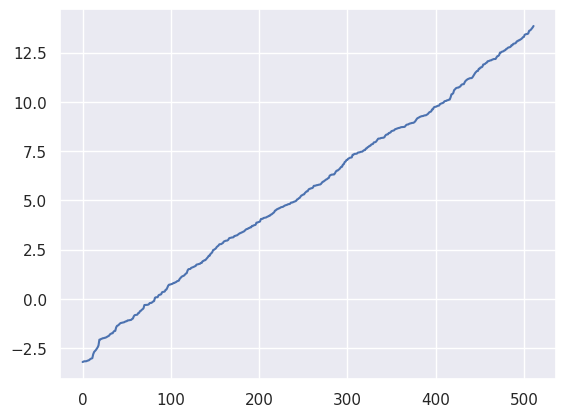

In [ ]:
plt.plot(jnp.sort(data['z_1d']))

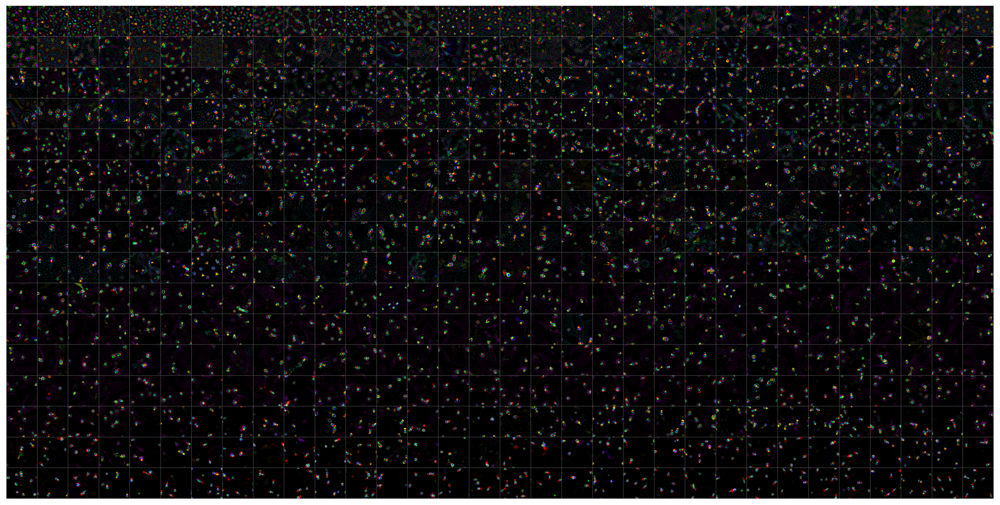

In [ ]:
img = data['rgb'][jnp.argsort(data['z_1d'])]
img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", C=32)
plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.grid(False)
plt.axis('off')
plt.show()

In [ ]:
z_2d = data['z_2d']
x, y = jnp.linspace(z_2d[:, 0].min(), z_2d[:, 0].max(), 64), jnp.linspace(z_2d[:, 1].min(), z_2d[:, 1].max(), 64)
x, y = jnp.meshgrid(x, y, indexing='ij')
x = jnp.stack([x, y], axis=-1)

In [ ]:
x.shape, z_2d.shape

((64, 64, 2), (512, 2))

In [ ]:
idx = jnp.linalg.norm(x[:, :, :] - z_2d[:, None, None, :], axis=-1).argmin(axis=0)
img = jnp.stack([data['rgb'][i] for i in idx.flatten()])
img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
img = rearrange(img, "(R C) H W D -> (R H) (C W) D", C=64)
plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.grid(False)
plt.axis('off')
plt.show()



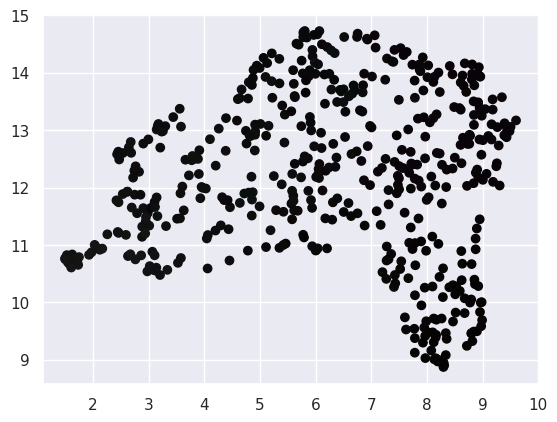

In [ ]:
plt.scatter(*data['z_2d'].T, c=data['rgb'].mean(axis=(1, 2)))

In [ ]:
substrates = ["Lenia", "Boids"]
substrate2data = dict()

for cfg, substrate in zip(cfgs, substrates):
    pop = util.load_pkl(cfg['save_dir'], 'pop')
    sim = FlattenSimulationParameters(create_sim(cfg['sim']))
    rollout_fn = partial(rollout_and_embed_simulation, sim=sim, clip_model=clip_model, rollout_steps=sim.sim.rollout_steps, n_rollout_imgs='final')
    rollout_fn = jax.jit(rollout_fn)

    rng = jax.random.PRNGKey(0)
    data = [rollout_fn(rng, p) for p in tqdm(pop['params'][:])]
    data = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *data)

    data['z_1d'] = UMAP(n_components=1, metric='cosine', random_state=0).fit_transform(data['z'])
    data['z_2d'] = UMAP(n_components=2, metric='cosine', random_state=0).fit_transform(data['z'])

    # idx = jnp.argsort(data['z_1d'].flatten())
    # data = jax.tree.map(lambda x: x[idx], data)

    substrate2data[substrate] = data


ParameterReshaper: 3117 parameters detected for optimization.


  0%|          | 0/1024 [00:00<?, ?it/s]

/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


ParameterReshaper: 193 parameters detected for optimization.


  0%|          | 0/1024 [00:00<?, ?it/s]

/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/akarsh_sakana_ai/miniconda3/envs/nca-alife-jax/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [ ]:
plt.figure(figsize=(40, 20))
for iplt, cfg, substrate in zip(range(len(cfgs)), cfgs, ["Lenia", "Boids"]):
    data = substrate2data[substrate]
    img = data['vid'][::8]
    img = jnp.pad(img, ((0, 0), (1, 1), (1, 1), (0, 0)), mode='constant', constant_values=0.5)
    img = rearrange(img, "(R C) H W D -> (R H) (C W) D", C=16)

    plt.subplot(2, 1, iplt+1)
    plt.title(f"Substrate: {substrate}", fontsize=25)
    plt.imshow(img)
    plt.grid(False)
    plt.axis('off')
plt.suptitle("Unsupervised Illumination", fontsize=35)
plt.tight_layout()
plt.show()